In [3]:
%matplotlib inline

# First, import pandas
import pandas as pd
import numpy as np

# We'll also import seaborn, a Python graphing library
import warnings # current version of seaborn generates a bunch of warnings that we'll ignore
warnings.filterwarnings("ignore")
import seaborn as sns
import matplotlib.pyplot as plt

# We'll also import altair 
from altair import Chart, Row, Column, Text, X, Y, Axis, Color, Scale, Legend

### Download data 1

In [ ]:
### Download Employee data  (anketa)

In [399]:
#Анкета
df_anketa = (pd.read_csv("../input/h_1_anketa.csv")
        .rename(columns={"Пол": "sex", "ДатаРождения": "date_of_birth", 
                         "ДатаПриема": "date_hired", "УИН Подразделения": "did",
                         "ЭтоРуководитель": "is_manager", "Место рождения": "city_of_birth",
                         "Должность": "position"
                        })
#         .drop(['Unnamed: 10', 'Unnamed: 11', 'Unnamed: 12', 'Unnamed: 13', 'Unnamed: 14', 
#                'Unnamed: 15', 'Unnamed: 16', 'Unnamed: 17', 'Unnamed: 18', 'Unnamed: 19', 'Unnamed: 20'], 1)
     )

#Подразделения 
df_departments = (pd.read_csv("../input/h_1_departments.csv")
        .rename(columns={" ": "department_name", "УИН Подразделения": "did", 
                         "УИН Родителя": "did_parent"
                        })
     )

#Обучение оффлайн
df_offline = (pd.read_csv("../input/h_1_learning_offline.csv")
        .rename(columns={"наименование программы": "program_name",
                         "Дата": "date", 
                         "фактическое количество часов": "time_spent",
                         "Оцека (если предусмотрена курсом)": "time_plan",
                         "uid тренера": "uid_coach"
                        })
     )

#Компетенции (Competencies)
df_comp = (pd.read_csv("../input/h_1_competencies.csv", decimal=',')
        .rename(columns={"Год": "year", 
                         "Месяц оценки": "month", 
                         "Дата оценки": "date",
                         "Ориентация на достижение":"ach", 
                         "Коммуникативная компетенция": "communication", 
                         "Сервисность": "service", 
                         "Технологичность": "tech", 
                         "Анализ данных": "analysis", 
                         "Лидерство": "leader", 
                         "Командность": "team", 
                         "Постановка задач": "task_settings", 
                         "Обратная связь": "feedback", 
                         "Мотивация к наставничеству": "mentor_motivation", 
                         "Понимание наставничества": "mentor_understanding", 
                         "Наставничество": "mentroship"
                        })
     )

#KPI ТП
df_kpi_tp = (pd.read_csv("../input/h_1_kpi_tp.csv", decimal=',')
             .rename(columns={"Должность": "position", 
                         "Балл": "score", 
                         "Месяц": "date"
                        })
             .assign(score = lambda x: x["score"].str.replace(',', '.').str.replace(' ', ''))
             .assign(score = lambda x: x["score"].astype('float64'))
     )

#KPI ВПП 
df_kpi_vpp = (pd.read_csv("../input/h_1_kpi_vpp.csv", decimal=',')
              .rename(columns={"План сотрудника": "vpp_plan", 
                         "Факт сотрудника": "vpp_fact", 
                         "% вып-я": "percentage",
                         "Число_чеков":"sale_counts", 
                         "Ср.чек": "sale_average", 
                         "месяц": "date"
                        })
              .assign(percentage = lambda x: x["percentage"].str.replace(',', '.').str.replace(' ', ''))
              .assign(percentage = lambda x: x["percentage"].str.replace('#ДЕЛ/0!', 'NaN'))
              .assign(percentage = lambda x: x["percentage"].astype('float64'))
              .assign(sale_average = lambda x: x["sale_average"].str.replace(' ', '').str.replace(' ', ''))
#               .assign(sale_average = lambda x: x["sale_average"].astype('float64'), raise_on_error=False))
     )


In [233]:
print([x for x in df_anketa.columns])
print([x for x in df_departments.columns])
print([x for x in df_offline.columns])
print([x for x in df_comp.columns])
print([x for x in df_kpi_tp.columns])
print([x for x in df_kpi_vpp.columns])

['uid', 'sex', 'date_of_birth', 'date_hired', 'did', 'is_manager', 'city_of_birth', 'position']
['department_name', 'did', 'did_parent']
['uid', 'program_name', 'is_webinar', 'date', 'time_spent', 'time_plan', 'uid_coach']
['uid', 'year', 'month', 'date', 'ach', 'communication', 'service', 'tech', 'analysis', 'leader', 'team', 'task_settings', 'feedback', 'mentor_motivation', 'mentor_understanding', 'mentroship']
['uid', 'position', 'score', 'date', 'dayfirst']
['uid', 'vpp_plan', 'vpp_fact', 'percentage', 'sale_counts', 'sale_average', 'date']


In [321]:
df_kpi_vpp.head()

,uid,vpp_plan,vpp_fact,percentage,sale_counts,sale_average,date,raise_on_error
0,u48,186 000,115 180,61.92,18,6399,апр.13,False
1,u1425,275 400,546 061,198.28,46,11871,апр.13,False
2,u759,275 400,419 891,152.47,48,8748,апр.13,False
3,u121,275 400,379 760,137.89,44,8631,апр.13,False
4,u1701,560 600,653 806,116.63,77,8491,апр.13,False


### Download data 2

In [393]:
#Курсы 
df_courses = (pd.read_csv("../input/h_2_courses.csv", decimal=',')
        .rename(columns={"наименование": "name", "max-score, максим который набрать": "max_possible_score", 
                         "проходной ли балл?": "is_passed", "сам ли назначил?": "does_he_appointed",
                         "когда активирован курс": "course_activated_at", "когда завершен": "course_finished_at",
                         "в срок ли завершен": "completed_in_period"
                        })
        .drop(['Unnamed: 10', 'Unnamed: 11', 'Unnamed: 12', 'Unnamed: 13', 'Unnamed: 14', 
               'Unnamed: 15', 'Unnamed: 16', 'Unnamed: 17', 'Unnamed: 18', 'Unnamed: 19', 'Unnamed: 20'], 1)
     )


#Тесты 
df_tests = (pd.read_csv("../input/h_2_tests.csv", decimal=',')
        .rename(columns={"Название теста": "test_name", 
                         "Максимальный балл": "max_score", 
                         "Баллы": "score",
                         "балл в %": "score_percent",
                         "оценка": "evaluation",
                         "проходной": "passed",
                         "Самоназначен": "self_initiated",
                         "Дата активации": "date_activated",
                         "дата завершения": "date_completed",
                         "курс завершен в день назначения": "complete_in_one_date",
                         "Дата (план) завершения": "date_plan_to_copmlete",
                         "завершен в срок": "in_time"
                        })
     )

#Библиотека
df_library = (pd.read_csv("../input/h_2_library.csv", decimal=',')
        .rename(columns={"наименование": "name",
                         "статус": "status"
                        })
    )

#Форум
df_forum = (pd.read_csv("../input/h_2_forum.csv", decimal=',')
        .rename(columns={"всего комментариев сделал сколько": "all_comments",
                         "создано тем": "topics_created", 
                         "сообщение": "messages_created",
                         "получено ответов": "answers_received"
                        })
    )

#Likes
df_likes = (pd.read_csv("../input/h_2_likes.csv")
        .rename(columns={"всего": "total"
                        })
    )
              
#Отзывы
df_feedback = (pd.read_csv("../input/h_2_feedback.csv")
        .rename(columns={"всего": "total"
                        })
    )
              
#Опросы
df_surveys = (pd.read_csv("../input/h_2_surveys.csv")
        .rename(columns={" ": "survey_name",
                         "статус": "status"
                        })
    )
              
#Комментарии
df_comments = (pd.read_csv("../input/h_2_comments.csv")
        .rename(columns={"всего": "total"
                        })
    )

In [179]:
print([x for x in df_courses.columns])
print([x for x in df_tests.columns])
print([x for x in df_library.columns])
print([x for x in df_forum.columns])
print([x for x in df_likes.columns])
print([x for x in df_feedback.columns])
print([x for x in df_surveys.columns])
print([x for x in df_comments.columns])

['uid', 'name', 'max_possible_score', 'score', '%', 'is_passed', 'does_he_appointed', 'course_activated_at', 'course_finished_at', 'completed_in_period']
['uid', 'test_name', 'max_score', 'score', 'score_percent', 'evaluation', 'passed', 'self_initiated', 'date_activated', 'date_completed', 'complete_in_one_date', 'date_plan_to_copmlete', 'in_time']
['uid', 'name', 'status']
['uid', 'all_comments', 'topics_created', 'messages_created', 'answers_received']
['uid', 'total']
['uid', 'total', 'event', 'lib', 'course', 'test']
['uid', 'Unnamed: 1', 'status']
['uid', 'total']


# Дескриптивная аналитика

### Сотрудники

In [280]:
# df_anketa
# df_departments
print([x for x in df_anketa.columns])
print([x for x in df_departments.columns])

['uid', 'sex', 'date_of_birth', 'date_hired', 'did', 'is_manager', 'city_of_birth', 'position']
['department_name', 'did', 'did_parent']


In [398]:
#enrich employee data with name of deparments 
df_employee = pd.merge(df_anketa, df_departments, how='left', on=['did'])
del df_employee['date_of_birth']
del df_employee['city_of_birth']
df_employee.head()

,uid,sex,date_hired,did,is_manager,position,department_name,did_parent
0,u1022,ж,01.01.2009,fc8f3b92-e535-11e1-a52a-001b789beaf2,0,Менеджер по товародвижению,NaN,NaN
1,u1023,ж,01.01.2009,fc8f3b92-e535-11e1-a52a-001b789beaf2,0,Менеджер по товародвижению,NaN,NaN
2,u1024,ж,01.01.2009,fc8f3b92-e535-11e1-a52a-001b789beaf2,0,Менеджер по товародвижению,NaN,NaN
3,u164,ж,01.01.2014,NaN,0,Менеджер по развитию розничной сети,NaN,NaN
4,u2117,м,01.01.2014,dd63a709-6cfc-11e0-a872-001b789beaf2,0,Курьер,Департамент персонала,c3718725-3053-11e1-80c3-001b789beaf2


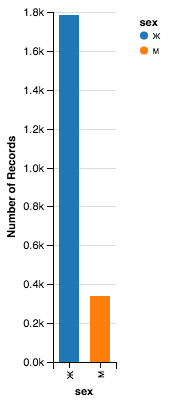

In [182]:
#Employees' distribution by sex
df_employee_notnull = df_employee[df_employee.did == "null"]
Chart(df_employee).mark_bar().encode(
    x='sex:N',
    y='count(sex):Q',
    color='sex:N',
)

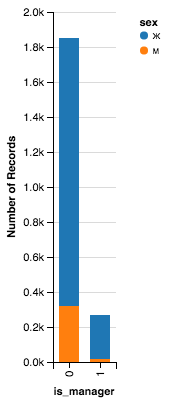

In [183]:
#Employees' distribution by 'is_manager'
Chart(df_employee).mark_bar().encode(
    x='is_manager:N',
    
    y='count(sex):Q',
    color='sex:N',
)

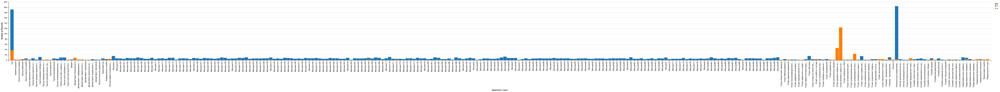

In [184]:
#Employees' distribution by Department
Chart(df_employee).mark_bar().encode(
    x='department_name:N',
    y='count(sex):Q',
    color='sex:N',
)

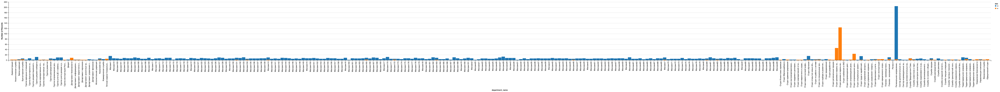

In [185]:
#remove what employees with 'neull' for 'did' or 'department_name'
df_employee_notnull = df_employee[df_employee.did.notnull()]
df_employee_notnull = df_employee[df_employee.department_name.notnull()]

# Employees by deparments by sex
Chart(df_employee_notnull).mark_bar().encode(
    x='department_name:N',
    y='count(sex):Q',
    color='sex:N',
)

### KPI data

In [271]:
print([x for x in df_kpi_tp.columns])
print([x for x in df_kpi_vpp.columns])

['uid', 'position', 'score', 'date', 'raise_on_error']
['uid', 'vpp_plan', 'vpp_fact', 'percentage', 'sale_counts', 'sale_average', 'date', 'raise_on_error']


In [400]:
df_kpi_tp.head()

,uid,position,score,date
0,u992,Продавец-кассир,99.40,май.13
1,u992,Продавец-кассир,0.00,июн.13
2,u992,Продавец-кассир,94.77,июл.13
3,u992,Продавец-кассир,0.00,авг.13
4,u992,Продавец-кассир,98.78,сен.13


In [403]:
#enrich employee data with name of deparments 
df_kpi = pd.merge(df_kpi_tp, df_kpi_vpp, how='left', on=['uid', 'date'])

# df_kpi.head()
df_kpi.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8589 entries, 0 to 8588
Data columns (total 9 columns):
uid             8589 non-null object
position        8589 non-null object
score           8581 non-null float64
date            8589 non-null object
vpp_plan        6531 non-null object
vpp_fact        6531 non-null object
percentage      6423 non-null float64
sale_counts     6531 non-null float64
sale_average    6531 non-null object
dtypes: float64(3), object(6)
memory usage: 671.0+ KB


In [295]:
#remove outliers 

In [404]:
# df_kpi = (df_kpi
#           .assign(score = lambda x: x["score"].str.replace(',', '.').str.replace(' ', ''))
#           )

tp_out= df_kpi[df.score > 100.0]
tp_out.head()

,uid,position,score,date,vpp_plan,vpp_fact,percentage,sale_counts,sale_average
9,u992,Продавец-кассир,100.00,фев.14,1 419 912,1 374 926,96.83,121.0,11363
14,u990,Продавец-кассир,0.00,апр.14,NaN,NaN,NaN,NaN,NaN
15,u99,Продавец,0.00,мар.14,NaN,NaN,NaN,NaN,NaN
16,u99,Продавец,0.00,апр.14,NaN,NaN,NaN,NaN,NaN
17,u989,Старший продавец-кассир,94.74,май.13,551 890,578 057,104.74,59.0,9798


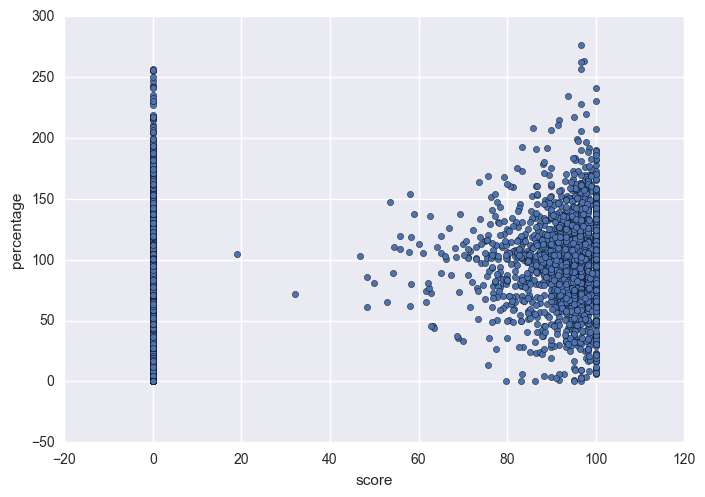

In [407]:
# df_kpi2 = df_kpi['uid', 'score', 'percentage', 'sale_average'
df_kpi2 = df_kpi[(df_kpi.score <= 100) 
                 & (df_kpi.percentage <= 300)
                 & (df_kpi.sale_counts <= 60000)
                ]

del df_kpi2['vpp_plan']
del df_kpi2['vpp_fact']

df_kpi_notnull = df_kpi2.dropna()
# print(df_kpi_notnull.score.max)

(df_kpi2.query('score <= 100' )
 .plot(kind='scatter', x='score', y='percentage'))

In [408]:
df_kpi2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6270 entries, 0 to 8586
Data columns (total 7 columns):
uid             6270 non-null object
position        6270 non-null object
score           6270 non-null float64
date            6270 non-null object
percentage      6270 non-null float64
sale_counts     6270 non-null float64
sale_average    6270 non-null object
dtypes: float64(3), object(4)
memory usage: 391.9+ KB


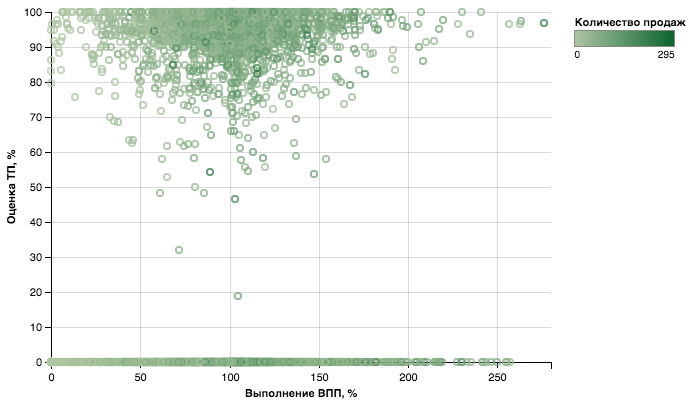

In [414]:
#выполнение KPI: выполнение ВПП и оценка ТП
Chart(df_kpi2).mark_point().encode(
    y=Y('score:Q', axis=Axis(title='Оценка ТП, %')),
    x=X('percentage:Q', axis=Axis(title='Выполнение ВПП, %')),
    color=Color('sale_counts:Q', legend=Legend(title='Количество продаж')),
#     color=Color('date:N', legend=Legend(title='Количество продаж')),
)

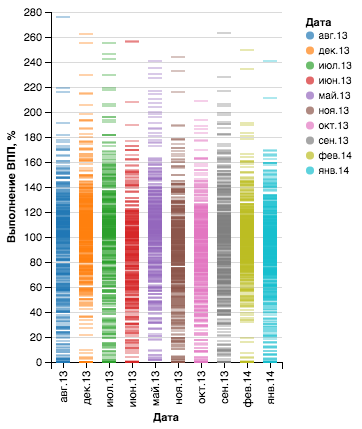

In [413]:
#выполнение KPI: выполнение ВПП по времени 
Chart(df_kpi2).mark_tick().encode(
    x=X('date:N', axis=Axis(title='Дата')),
    y=Y('percentage:Q', axis=Axis(title='Выполнение ВПП, %')),
    color=Color('date:N', legend=Legend(title='Дата')),
)

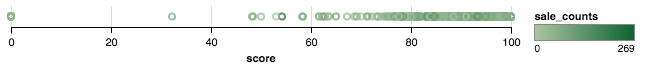

In [350]:
Chart(df_kpi2).mark_point().encode(
    x='score:Q',
#     y='count(score):Q',
    color='sale_counts:Q',
)

# Learning

In [387]:
print([x for x in df_courses.columns])
print([x for x in df_tests.columns])
print([x for x in df_library.columns])
print([x for x in df_forum.columns])
print([x for x in df_likes.columns])
print([x for x in df_feedback.columns])
print([x for x in df_surveys.columns])
print([x for x in df_comments.columns])
print([x for x in df_offline.columns])
print([x for x in df_comp.columns])

['uid', 'name', 'max_possible_score', 'score', '%', 'is_passed', 'does_he_appointed', 'course_activated_at', 'course_finished_at', 'completed_in_period']
['uid', 'test_name', 'max_score', 'score', 'score_percent', 'evaluation', 'passed', 'self_initiated', 'date_activated', 'date_completed', 'complete_in_one_date', 'date_plan_to_copmlete', 'in_time']
['uid', 'name', 'status']
['uid', 'all_comments', 'topics_created', 'messages_created', 'answers_received']
['uid', 'total']
['uid', 'total', 'event', 'lib', 'course', 'test']
['uid', 'Unnamed: 1', 'status']
['uid', 'total']
['uid', 'program_name', 'is_webinar', 'date', 'time_spent', 'time_plan', 'uid_coach']
['uid', 'year', 'month', 'date', 'ach', 'communication', 'service', 'tech', 'analysis', 'leader', 'team', 'task_settings', 'feedback', 'mentor_motivation', 'mentor_understanding', 'mentroship']


In [409]:
df_employee.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2120 entries, 0 to 2119
Data columns (total 8 columns):
uid                2120 non-null object
sex                2120 non-null object
date_hired         2120 non-null object
did                2110 non-null object
is_manager         2120 non-null int64
position           2120 non-null object
department_name    1928 non-null object
did_parent         1928 non-null object
dtypes: int64(1), object(7)
memory usage: 149.1+ KB


In [410]:
df_kpi2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6270 entries, 0 to 8586
Data columns (total 7 columns):
uid             6270 non-null object
position        6270 non-null object
score           6270 non-null float64
date            6270 non-null object
percentage      6270 non-null float64
sale_counts     6270 non-null float64
sale_average    6270 non-null object
dtypes: float64(3), object(4)
memory usage: 391.9+ KB


In [386]:
#преобразовать Даты форма ДД.ММ.ГГГГ в формат мес.ГГ  (пример: фев.14)


In [ ]:
# df_kpi_learn = pd.DataFrame({"Value": arms_export.Value.astype(float).fillna(0.0),
        
#     })